## Import das bibliotecas utilizadas


In [1]:
import pandas as pd
import numpy as np
import openpyxl

import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import multimode
from sklearn.metrics import mean_squared_error, mean_absolute_error



### Carregamento dos dados para a parte de Modelagem

In [2]:
df_transposed_copy_inputting_v19 = pd.read_csv(r'Projeto/Data/Output/df_transposed_copy_inputting_v19.csv')


## Modelagem

Modelos de Forecasting são divididos em partes pré e pós período desejado para previsão. Os períodos utilizados devem ser equiparáveis ao tipo de questão analisada.

In [3]:
df_model = df_transposed_copy_inputting_v19.copy()

In [4]:
df_model['year'] = pd.to_datetime(df_model['year'], format='ISO8601')


In [5]:
df_model.set_index('year', inplace = True)
df_model.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 49 entries, 1980-01-01 to 2028-01-01
Columns: 228 entries, Afghanistan to World
dtypes: float64(228)
memory usage: 87.7 KB


In [6]:
df_model.head(5)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
1980-01-01,4.345486,2.7,-5.4,2.877381,2.4,8.2,0.7,5.290000,5.399885,2.9,...,-0.8,3.3,3.988678,1.8,6.4,0.9,-1.9,3.8,3.991920,2.1
1981-01-01,7.200000,5.7,3.0,0.385714,-4.4,3.8,-5.7,3.798462,-3.624698,4.1,...,-0.5,1.9,1.792949,0.1,0.9,2.0,-0.2,4.2,4.567689,1.9
1982-01-01,5.116667,2.9,6.4,0.371429,0.0,-0.1,-3.1,2.306923,4.538833,0.1,...,1.4,1.5,5.395555,0.6,-0.5,-0.1,0.4,2.2,8.037341,0.7
1983-01-01,4.283333,1.1,5.4,1.471429,4.2,5.4,3.7,0.815385,1.930603,-0.5,...,4.6,1.8,4.752000,1.7,-2.8,3.3,0.7,4.0,3.300508,2.6
1984-01-01,6.166667,2.0,5.6,2.585714,6.0,10.2,2.0,-0.676154,-15.680825,6.3,...,4.1,4.1,-0.599934,2.5,3.9,5.0,0.3,6.6,5.023940,4.6


#### Training and Test set

In [7]:
test_years = 6
train_data = df_model.iloc[:-test_years, :]
train_data.tail(1)

,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
2022-01-01,3.55,3.7,2.9,8.7,2.8,6.4,5.2,12.6,5.7,3.7,...,0.8,4.0,3.5,3.7,4.0,2.3,5.3,2.6,3.9,3.4


In [8]:
test_data = df_model.iloc[-test_years:, :]
test_data.tail(1)


,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,...,Emerging and Developing Europe,Emerging market and developing economies,Euro area,European Union,Latin America and the Caribbean,Major advanced economies (G7),Middle East and Central Asia,Other advanced economies,Sub-Saharan Africa,World
year,,,,,,,,,,,,,,,,,,,,,
2028-01-01,5.033333,3.4,1.8,1.5,4.2,2.7,2.0,4.5,1.1,2.3,...,2.3,3.9,1.4,1.7,2.3,1.6,3.7,2.3,4.4,3.0


### Exponential Smoothing

No método Exponential Smoothing os dados mais recentes possuem maior relevância para a análise, em comparação aos dados mais antigos. 

#### Holt-Winters

O método de Holt-Winters divide a série temporal em 3 níveis, sendo eles: 
- Level (passado mais recente do conjunto de dados)
- Trend
- Seasonality

Um exponential smoothing é realizado em cada um dos três níveis. É considerado uma abordagem simples onde, muitas vezes, as predições não acompanham os dados de teste.

In [9]:
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [10]:
#Forecasting Model
for country in df_model.columns: 
    model_hw = ExponentialSmoothing(endog = train_data[country], trend ='add', seasonal = 'add', seasonal_periods= 4).fit()

/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/hingryd/Documents/Lighthouse/DS/venv/l

In [11]:
# Predictions
for country in df_model.columns: 

    predictions_hw = model_hw.forecast(steps= len(test_data[country])).rename('Holt-Winters')
    predictions_hw.head()

### Visualization

/tmp/ipykernel_1388344/570316034.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


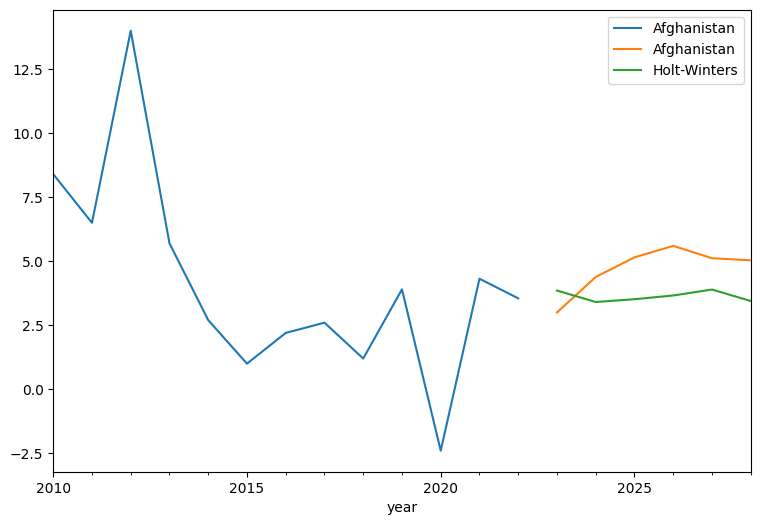

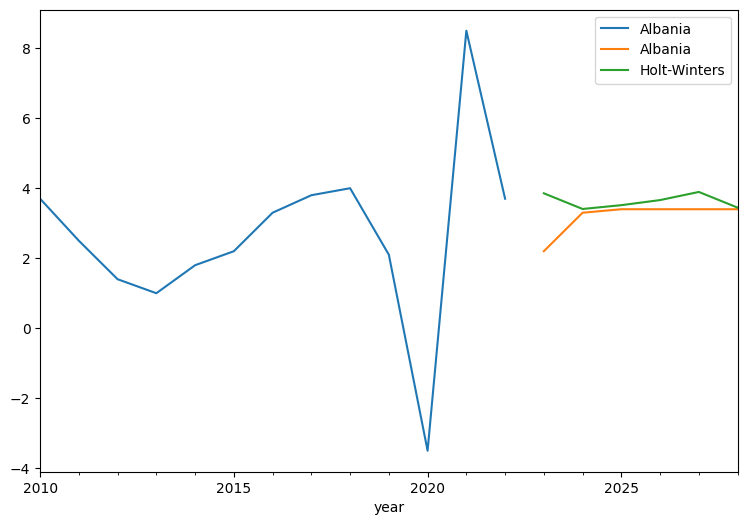

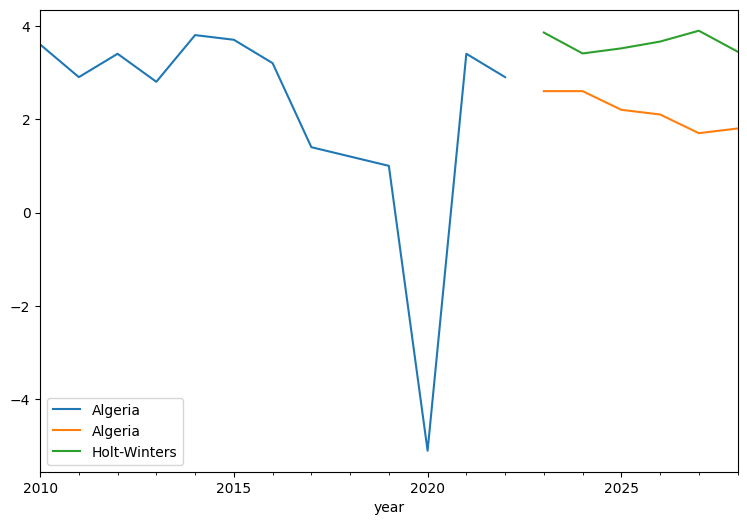

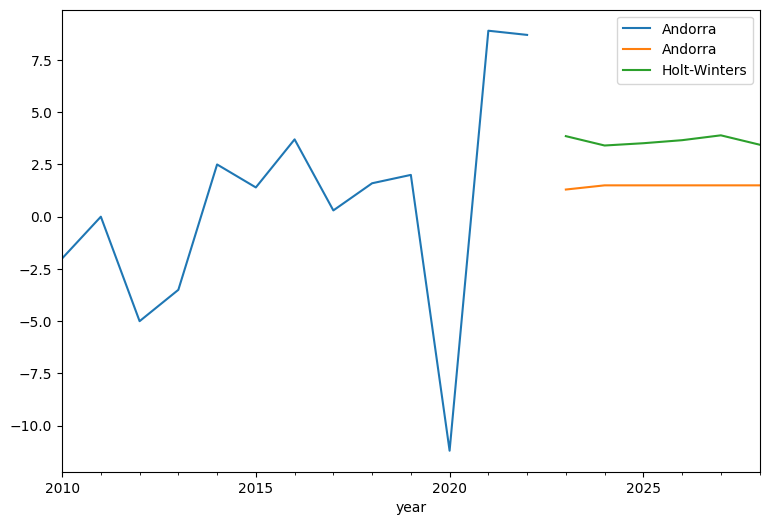

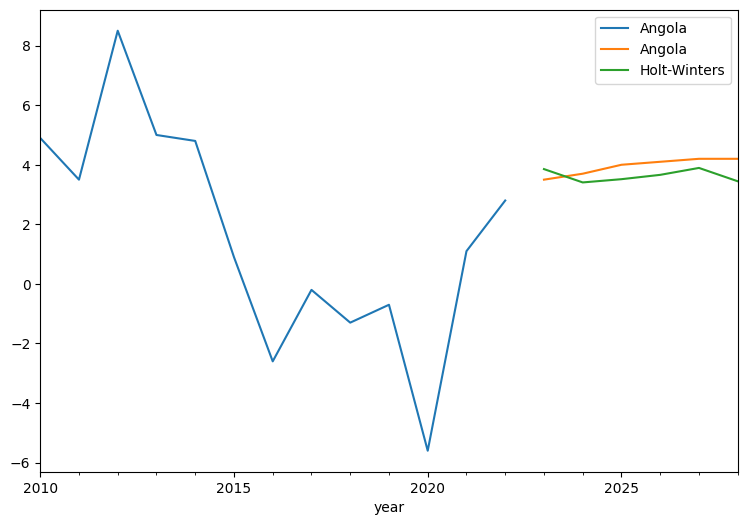

...

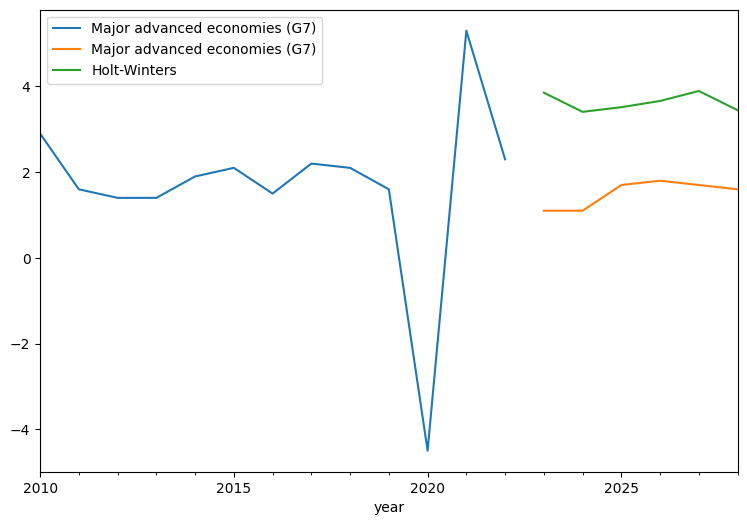

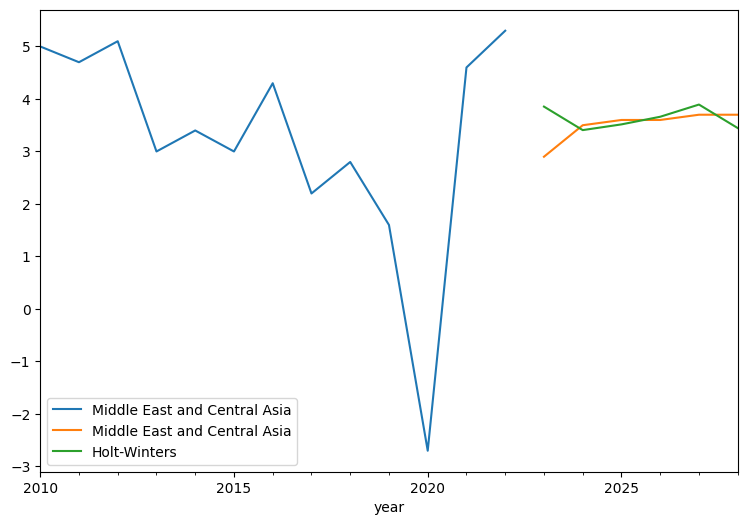

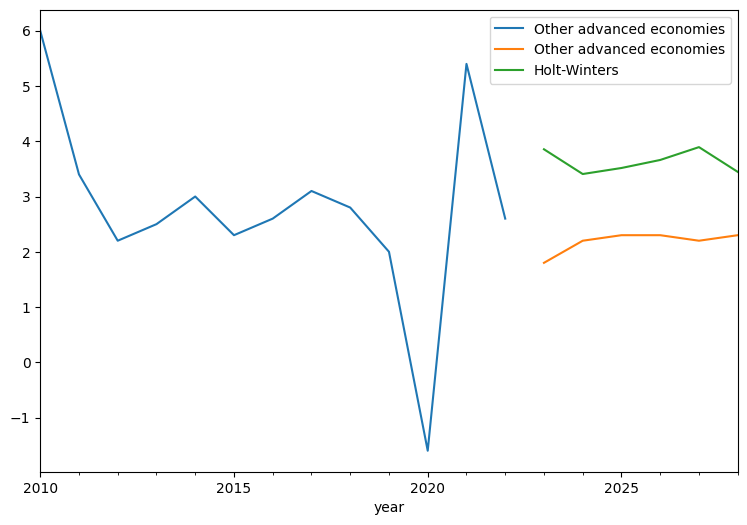

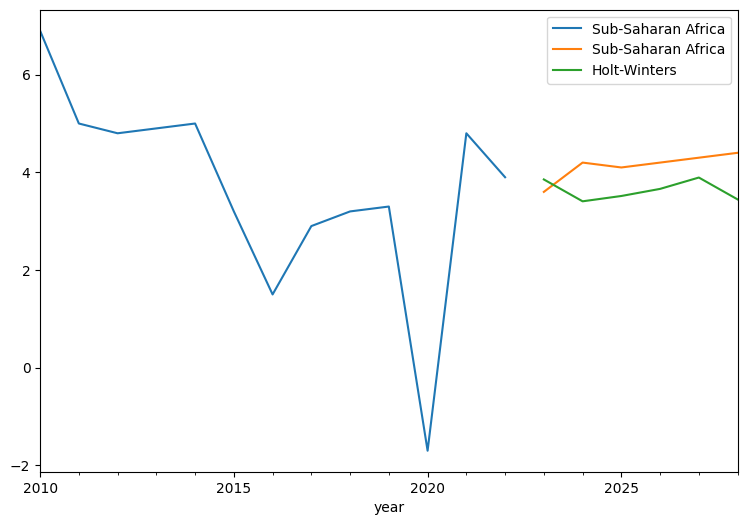

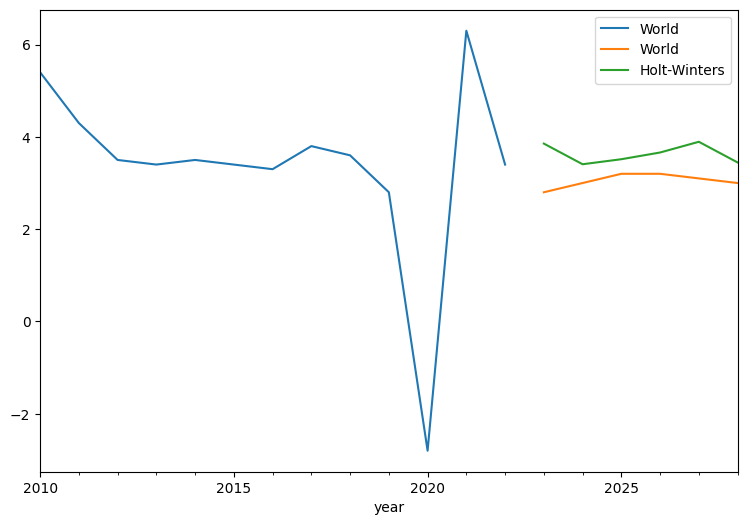

In [12]:
# Visualization
for country in df_model.columns: 
    plt.figure()
    train_data[country]['2010-01-01':].plot(figsize = (9,6), legend = True)
    test_data[country].plot(legend = True)
    predictions_hw.plot(legend = True)

### KPIS de Avaliação do Modelo
 Indicadores para medir a performance do modelo. MAE e RSME são indicadores de performance para modelos de regressão com variáveis dependentes contínuas. Não existem indicadores considerados 'perfeitos', existem os indicadores melhores apropriados para o problema analisado.

 - MAE - (Mean Absolute Error) É um indicador mais interpretável, utilizado quando a série temporal trata de taxas, porcentagens.
- RSME -  (Root Square Mean Error) São utilizados para modelos com outliers/extremos.
- MAPE - (Mean Absolute Percentage Error) Apesar de tratar os erros de forma absoluta é considerado um indicador mais agradável para comunicar a respeito do modelo. 

In [28]:
def MAPE(df_model_true, df_model_pred):
    df_model_true, df_model_pred = np.array(df_model_true), np.array(df_model_pred)
    return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100

metrics_hw = pd.DataFrame()
metrics_results = []
# Loop para métricas mae, rmse e mape
for country in df_model.columns:
    mae = round(mean_absolute_error(test_data[country], predictions_hw),2)
    rmse = round(np.sqrt(mean_squared_error(test_data[country], predictions_hw)), 2)
    mape = MAPE(test_data[country], predictions_hw)

    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_hw = pd.DataFrame(metrics_results)
metrics_hw.to_csv('Projeto/Data/Metrics/metrics_hw.csv', index = True)

/tmp/ipykernel_1388344/3578682449.py:5: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100
/tmp/ipykernel_1388344/3578682449.py:5: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100


### Export forecasts for Holt-Winters

In [30]:
## Export forecast

predictions_hw.to_csv('Projeto/Data/Output/predictions_hw.csv', index = True)

### Modelo Simple Exponential Smoothing

In [37]:
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt


In [38]:
# simple exponetial smooting
for country in df_model.columns:
    model_simple_exp_smoot = SimpleExpSmoothing(
        train_data[country],
        initialization_method='heuristic',                              
    ).fit(smoothing_level=0.2, optimized=True)

pred_simple_exp_smoot = model_simple_exp_smoot.forecast(test_data.shape[0])

/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pandas/util/_decorators.py:210: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency AS-JAN will be used.
  self._init_dates(dates, freq)
/home/hingryd/Documents/Lighthouse/DS/venv/lib/python3.10/site-packages/pandas/util/_decorators.py:210: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
/home/hingryd/Documents/Lighthouse/DS/ve

### Visualization

/tmp/ipykernel_1388344/3659843260.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


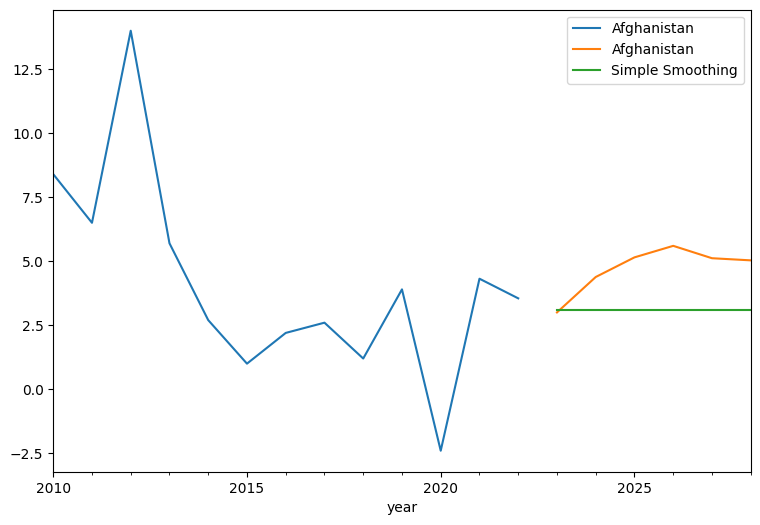

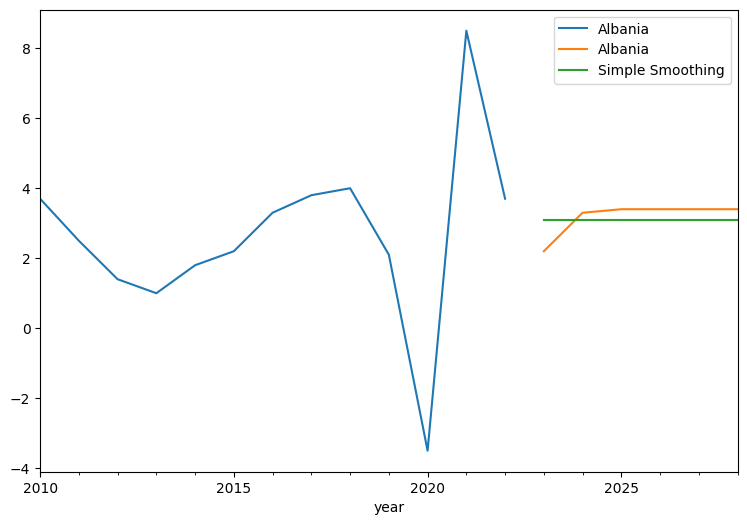

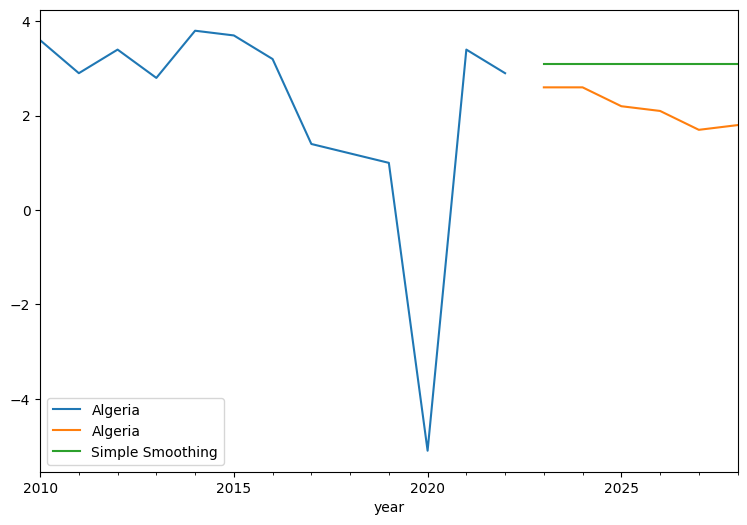

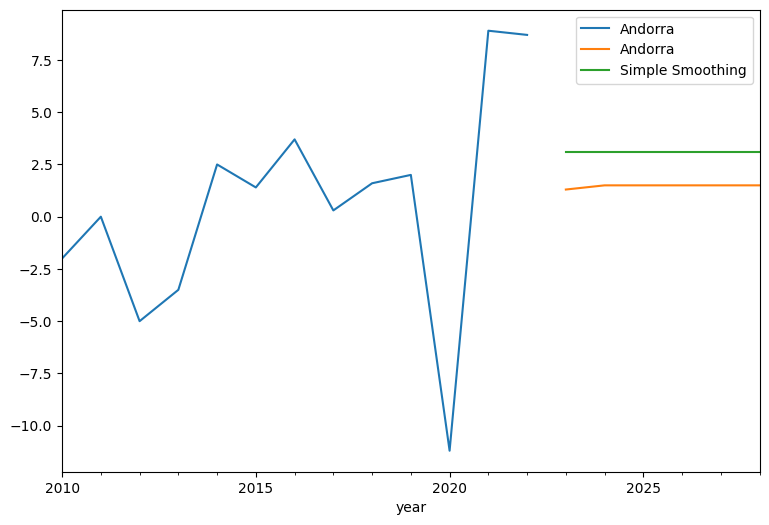

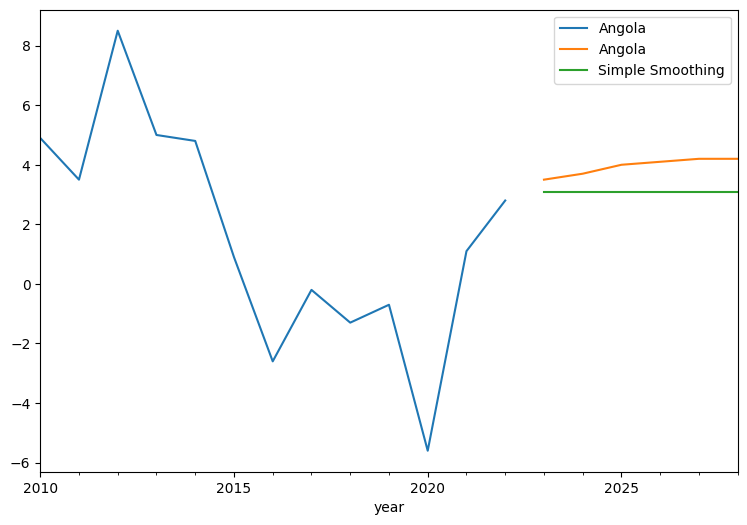

...

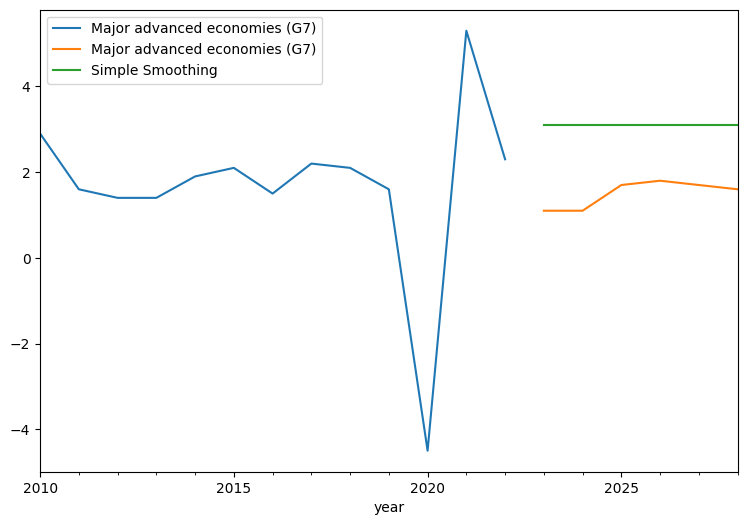

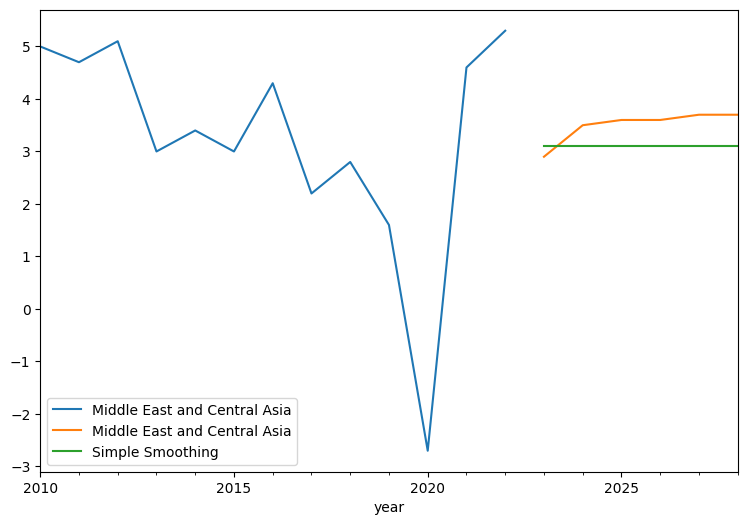

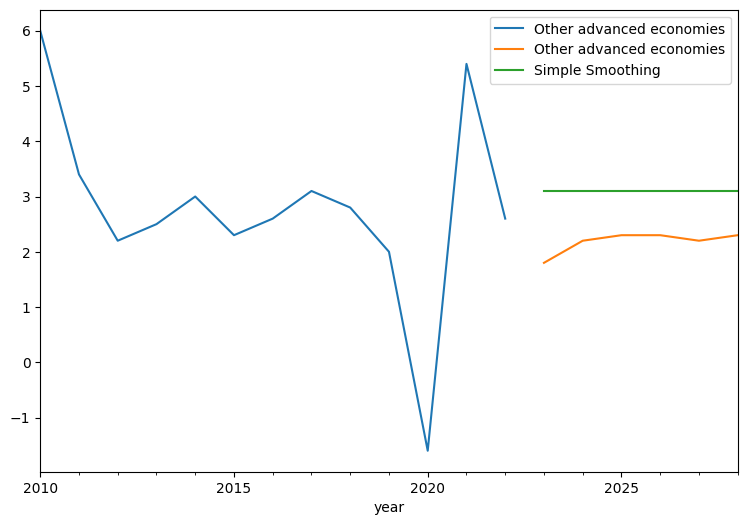

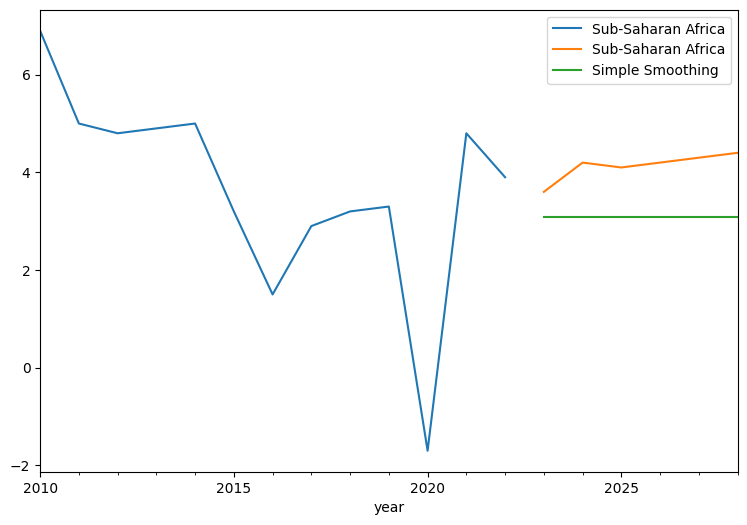

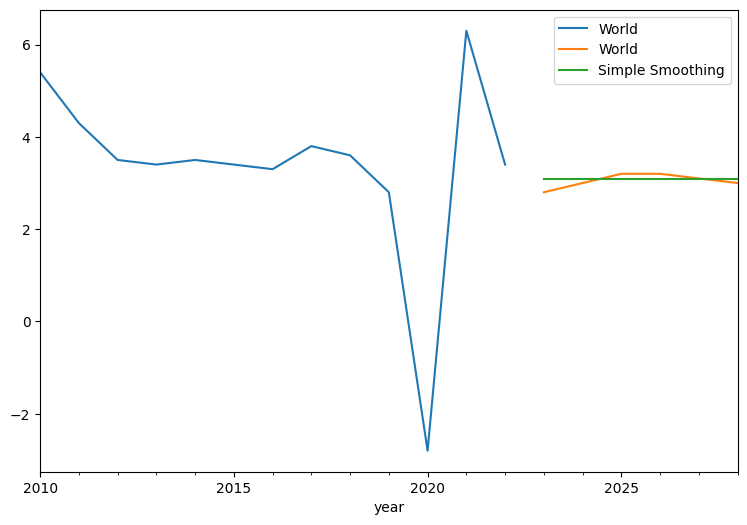

In [19]:
for country in df_model.columns:
    plt.figure()
    train_data[country]['2010-01-01':].plot(figsize = (9,6), legend = True)
    test_data[country].plot(legend = True)
    pred_simple_exp_smoot.plot(legend=True, label='Simple Smoothing')


### Metrics

In [39]:
def MAPE(df_model_true, df_model_pred):
    df_model_true, df_model_pred = np.array(df_model_true), np.array(df_model_pred)
    return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100

metrics_pred_simple_exp_smoot = pd.DataFrame()
metrics_results = []
# Loop para métricas mae, rmse e mape
for country in df_model.columns:
    mae = round(mean_absolute_error(test_data[country], pred_simple_exp_smoot),2)
    rmse = round(np.sqrt(mean_squared_error(test_data[country], pred_simple_exp_smoot)), 2)
    mape = MAPE(test_data[country], pred_simple_exp_smoot)

    metrics_results.append({
        "Country": country,
        "MAE": mae,
        "RMSE": rmse,
        "MAPE": mape
    })

metrics_pred_simple_exp_smoot = pd.DataFrame(metrics_results)
metrics_pred_simple_exp_smoot.to_csv('Projeto/Data/Metrics/metrics_pred_simple_exp_smoot.csv', index = True)

/tmp/ipykernel_1388344/1042480860.py:3: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100
/tmp/ipykernel_1388344/1042480860.py:3: RuntimeWarning: divide by zero encountered in divide
  return np.mean(np.abs((df_model_true - df_model_pred)/ df_model_true)) *100


In [41]:
## Export forecast

pred_simple_exp_smoot.to_csv('Projeto/Data/Output/predictions_simple_exponential.csv', index = True)

### Comparação de Métricas entre Modelos

DataFrame: Holt-Winters
Métrica: MAE
mean      1.659518
median    1.360000
std       1.853458
Name: MAE, dtype: float64


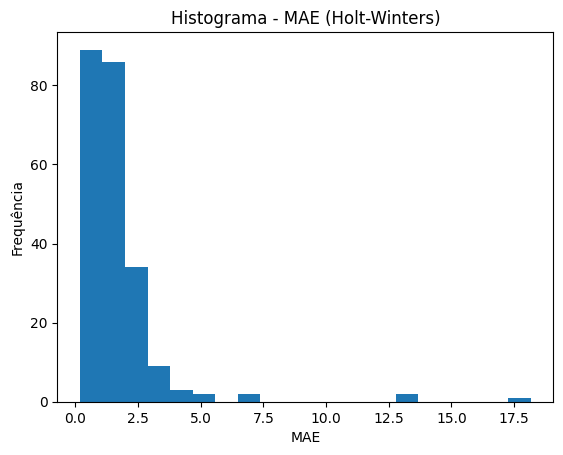



Top 20 MAE (Holt-Winters):
                    Country    MAE   RMSE         MAPE
71                   Guyana  18.17  25.67    49.656441
102               Macao SAR  13.08  23.64    44.459172
96                  Lebanon  13.04  13.08   139.137422
53        Equatorial Guinea   7.23   7.96   438.006945
183                 Ukraine   6.63   6.63   220.992761
118              Mozambique   5.25   6.90    48.383756
199               Caribbean   5.11   6.56    61.687392
99                    Libya   4.40   6.24    44.111977
140             Puerto Rico   4.25   4.27   688.070366
168                   Syria   3.80   6.36  1187.523822
126                   Niger   3.70   4.56    46.123446
144                  Rwanda   3.29   3.37    46.945153
190               Venezuela   3.27   3.60   415.844335
14               Bangladesh   3.17   3.25    45.996241
151                 Senegal   3.09   3.78    40.914239
39   Dem. Rep. of the Congo   3.00   3.02    45.209778
191                 Vietnam   2.97  

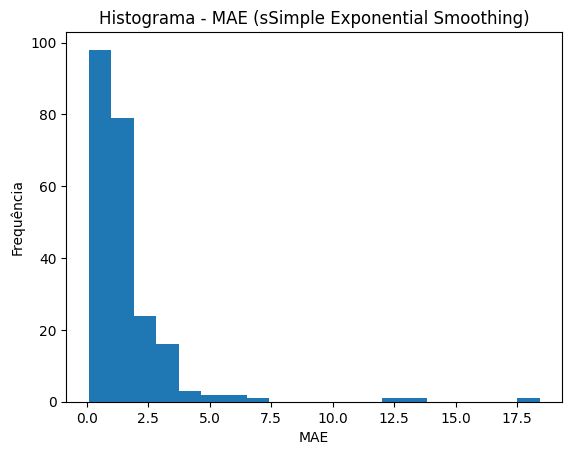



Top 20 MAE (sSimple Exponential Smoothing):
                    Country    MAE   RMSE         MAPE
71                   Guyana  18.42  26.04    49.625381
102               Macao SAR  13.44  23.99    48.277011
96                  Lebanon  12.50  12.55   133.350953
53        Equatorial Guinea   6.70   7.52   392.057075
183                 Ukraine   6.10   6.10   203.178321
118              Mozambique   5.79   7.32    56.071247
199               Caribbean   5.12   6.88    52.887627
99                    Libya   4.94   6.67    52.254496
126                   Niger   4.24   4.94    54.357270
168                   Syria   3.91   6.45  1008.624732
144                  Rwanda   3.82   3.86    54.947577
140             Puerto Rico   3.71   3.76   589.006915
14               Bangladesh   3.70   3.76    54.008883
151                 Senegal   3.62   4.19    49.799647
39   Dem. Rep. of the Congo   3.54   3.55    53.281261
191                 Vietnam   3.50   3.52    52.942362
57                 

In [42]:

# Lista de métricas
metrics = ['MAE']

# Dicionário de DataFrames com seus respectivos nomes
dataframes = {
    'Holt-Winters': metrics_hw,
    'Simple Exponential Smoothing': metrics_pred_simple_exp_smoot
}

# Iterar sobre os DataFrames e as métricas
for df_name, df in dataframes.items():
    print(f"DataFrame: {df_name}")
    
    for metric in metrics:
        print(f"Métrica: {metric}")
        
        # Agregar as estatísticas
        aggregated = df[metric].agg(['mean', 'median', 'std'])
        print(aggregated)
        
        # Gerar histograma
        plt.hist(df[metric], bins=20)
        plt.title(f"Histograma - {metric} ({df_name})")
        plt.xlabel(metric)
        plt.ylabel("Frequência")
        plt.show()

        print("\n")

    # Mostrar os top 20 valores maiores de MAE
    top_20 = df.sort_values(by='MAE', ascending=False).head(20)
    print(f"Top 20 MAE ({df_name}):\n{top_20}\n")
